# DS4A: MinJusticia
## Reducing the recidivim risk for people released from jail between 2010 and 2019 <br> 

The Ministry of Justice leads the development of public policies that guarantee the effective protection of the rights of their citizens. Currently, the penitentiary and prison entities are interested in characterizing the jail population in Colombia and their recidivism risk to ensure an adequate formulation and monitoring of the criminal policy. <br><br>

**Team 77** <br>
**Members:** Sergio Bernal, Wilfer Carvajal , Diego Costa, Laura Goyeneche, Esneyder Guerrero, Daniel Hoyos, Katerin Lopez <br>
**Date:** June, 2020 

### Index

1. Introduction
2. General Statistics
3. Maps: Spatial Distribution
4. Frequencies
5. Descriptive Statistics over time
6. Missing Values

## Introduction

In [1]:
# Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objects as go
import json
from urllib.request import urlopen

from lifelines import KaplanMeierFitter

%matplotlib inline
plt.style.use('seaborn')

In [2]:
# Import data
inmate = pd.read_excel('data/ReincidenciaPospenadosNal201011Junio2020Rev.xlsx', skiprows = 6)

In [3]:
# Data sample
inmate.head(3)

,INTERNOEN,DELITO,TITULO_DELITO,SUBTITULO_DELITO,TENTATIVA,AGRAVADO,CALIFICADO,FECHA_INGRESO,FECHA_SALIDA,FECHA_CAPTURA,...,ACTIVIDADES_ENSEÑANZA,NIVEL_EDUCATIVO,HIJOS_MENORES,CONDIC_EXPECIONAL,CODIGO_ESTABLECIMIENTO,ESTABLECIMIENTO,DEPTO_ESTABLECIMIENTO,MPIO_ESTABLECIMIENTO,REGIONAL,ESTADO
0,5496C737C624136DB406CFC6744C684C070A3CD8,FABRICACION TRAFICO Y PORTE DE ARMAS DE FUEGO ...,CONTRA LA SEGURIDAD PUBLICA,DE LOS DELITOS DE PELIGRO COMUN O QUE PUEDEN O...,N,N,N,01/01/10,12/05/11,30/12/09,...,NO,CICLO III,SI,NaN,502,EPMSC MEDELLIN,ANTIOQUIA,MEDELLIN,NOROESTE,Baja
1,1097561F306939C26DB4AC60377063DA7E2B079F,TRAFICO FABRICACION O PORTE DE ESTUPEFACIENTES,CONTRA LA SALUD PUBLICA,DE LAS AFECTACIONES A LA SALUD PUBLICA,N,N,N,01/01/10,05/12/11,30/12/09,...,NO,CICLO I,SI,NaN,502,EPMSC MEDELLIN,ANTIOQUIA,MEDELLIN,NOROESTE,Baja
2,CB7033A707ADE673139F8A17CAD26AD54696C135,FABRICACION TRAFICO Y PORTE DE ARMAS DE FUEGO ...,CONTRA LA SEGURIDAD PUBLICA,DE LOS DELITOS DE PELIGRO COMUN O QUE PUEDEN O...,N,N,N,01/01/10,06/08/13,30/12/09,...,NO,CICLO I,SI,NaN,235,EPAMSCAS POPAYAN (ERE),CAUCA,POPAYAN,OCCIDENTE,Baja


In [4]:
# Feature changes
# Dates
inmate.FECHA_INGRESO = pd.to_datetime(inmate.FECHA_INGRESO)
inmate.FECHA_SALIDA  = pd.to_datetime(inmate.FECHA_SALIDA)
inmate.FECHA_CAPTURA = pd.to_datetime(inmate.FECHA_CAPTURA)

# Crime types
inmate.TENTATIVA  = inmate.TENTATIVA .apply(lambda x: 1 if x == 'S' else 0)
inmate.AGRAVADO   = inmate.AGRAVADO  .apply(lambda x: 1 if x == 'S' else 0)
inmate.CALIFICADO = inmate.CALIFICADO.apply(lambda x: 1 if x == 'S' else 0)

# Activities
inmate.ACTIVIDADES_TRABAJO   = inmate.ACTIVIDADES_TRABAJO  .apply(lambda x: 1 if x == 'SI' else 0)
inmate.ACTIVIDADES_ESTUDIO   = inmate.ACTIVIDADES_ESTUDIO  .apply(lambda x: 1 if x == 'SI' else 0)
inmate.ACTIVIDADES_ENSEÑANZA = inmate.ACTIVIDADES_ENSEÑANZA.apply(lambda x: 1 if x == 'SI' else 0)

## General Statistics

In [5]:
# Basic information
print(
'''
Number of records (inmates, booking date): {} 
Number of variables                      : {} 
Number of inmates                        : {}
Number of crime types                    : {}
Start and end capture date               : {} and {}
Start and end booking date               : {} and {}
Start and end release date               : {} and {}

Top 5 cities with higher # of inmates    : {}
Mininimum, maximum and average age       : {}, {} and {}
% of colombians                          : {}%
% of inmates with children under 18      : {}%
% if iliterate inmates                   : {}%
% women and % men                        : {}% and {}%
'''
.format(inmate.shape[0], 
        inmate.shape[1], 
        inmate.INTERNOEN.unique().shape[0], 
        inmate.DELITO.unique().shape[0],
        inmate.FECHA_CAPTURA.min(), inmate.FECHA_CAPTURA.max(),
        inmate.FECHA_INGRESO.min(), inmate.FECHA_INGRESO.max(),
        inmate.FECHA_SALIDA.dropna().min(), inmate.FECHA_SALIDA.dropna().max(),
        list(inmate.MPIO_ESTABLECIMIENTO.value_counts().head(5).to_frame().index),
        inmate.EDAD.dropna().min(), inmate.EDAD.dropna().max(), round(inmate.EDAD.dropna().mean(),2),
        round(100*inmate[inmate.PAIS_INTERNO == 'REPUBLICA DE COLOMBIA'].PAIS_INTERNO.count()/inmate.shape[0],2),
        round(100*(inmate.HIJOS_MENORES == 'SI').sum()/inmate.shape[0],2),
        round(100*(inmate.NIVEL_EDUCATIVO == 'ANALFABETA').sum()/inmate.shape[0],2),
        round(100*(inmate.GENERO == 'FEMENINO').sum()/inmate.shape[0],2), round(100*(inmate.GENERO == 'MASCULINO').sum()/inmate.shape[0],2))
)


Number of records (inmates, booking date): 142899 
Number of variables                      : 32 
Number of inmates                        : 78841
Number of crime types                    : 259
Start and end capture date               : 1978-12-16 00:00:00 and 2020-12-05 00:00:00
Start and end booking date               : 2010-01-01 00:00:00 and 2020-12-05 00:00:00
Start and end release date               : 2001-03-04 00:00:00 and 2020-12-05 00:00:00

Top 5 cities with higher # of inmates    : ['BOGOTA D.C.', 'MEDELLIN', 'SANTIAGO DE CALI', 'BUCARAMANGA', 'ACACIAS']
Mininimum, maximum and average age       : 19, 94 and 37.35
% of colombians                          : 97.63%
% of inmates with children under 18      : 78.98%
% if iliterate inmates                   : 2.6%
% women and % men                        : 7.99% and 92.01%



## Maps: Spatial Distribution

In [6]:
# Get json file for Departamentos in Colombia
jsonCOL = 'https://gist.githubusercontent.com/john-guerra/43c7656821069d00dcbc/raw/be6a6e239cd5b5b803c6e7c2ec405b793a9064dd/Colombia.geo.json'
with urlopen(jsonCOL) as response:
    counties = json.load(response)

# Id as Departamento name for mapping
for loc in counties['features']:
    loc['id'] = loc['properties']['NOMBRE_DPT']

### Number of inmates across Departamentos

In [7]:
# Calculate # of inmates by Departamento of origin in Colombia
temp = inmate.groupby(['DEPTO_ESTABLECIMIENTO','INTERNOEN']).DELITO.count().reset_index() \
       .rename(columns = {'DELITO':'count'}).DEPTO_ESTABLECIMIENTO.value_counts().to_frame().reset_index() \
       .rename(columns = {'index':'DEPTO','DEPTO_ESTABLECIMIENTO':'ncount'}) 

# Departamentos names in json file
jsonDPTOname = [depto['properties']['NOMBRE_DPT'] for depto in counties['features']]

# Find differences between Dpto name in dataset and json file
print('Depto names not in inmates data:', set(jsonDPTOname) - set(temp.DEPTO))
print('Depto names not in json file   :', set(temp.DEPTO) - set(jsonDPTOname))

# Change Departamentos names
temp.DEPTO = temp.DEPTO.replace({'BOGOTA D.C.':'SANTAFE DE BOGOTA D.C','SAN ANDRES Y PROVIDENCIA':'ARCHIPIELAGO DE SAN ANDRES PROVIDENCIA Y SANTA CATALINA'})

Depto names not in inmates data: {'VICHADA', 'ARCHIPIELAGO DE SAN ANDRES PROVIDENCIA Y SANTA CATALINA', 'GUAINIA', 'VAUPES', 'GUAVIARE', 'SANTAFE DE BOGOTA D.C'}
Depto names not in json file   : {'BOGOTA D.C.', 'SAN ANDRES Y PROVIDENCIA'}


In [8]:
# Map
fig = go.Figure(go.Choroplethmapbox(geojson = counties, locations = temp.DEPTO, z = temp.ncount, 
                                    colorscale = 'reds', marker_opacity = 0.8, marker_line_width = 0.2))
                           
fig.update_layout(mapbox_style = "carto-positron", mapbox_zoom = 4.5,
                  mapbox_center = {"lat": 4.570868, "lon": -74.2973328}, margin = {"r":0, "t":0, "l":0, "b":0})

fig.show()

### Number of records (inmate, capture date) across Departamentos

In [9]:
# Calculate # of inmates by Departamento of origin in Colombia
temp = inmate.groupby(['DEPTO_ESTABLECIMIENTO']).DELITO.count().reset_index().rename(columns = {'DEPTO_ESTABLECIMIENTO':'DEPTO','DELITO':'ncount'}) 

# Change Departamentos names
temp.DEPTO = temp.DEPTO.replace({'BOGOTA D.C.':'SANTAFE DE BOGOTA D.C','SAN ANDRES Y PROVIDENCIA':'ARCHIPIELAGO DE SAN ANDRES PROVIDENCIA Y SANTA CATALINA'})

In [10]:
# Map
fig = go.Figure(go.Choroplethmapbox(geojson = counties, locations = temp.DEPTO, z = temp.ncount, 
                                    colorscale = 'reds', marker_opacity = 0.8, marker_line_width = 0.2))
                           
fig.update_layout(mapbox_style = "carto-positron", mapbox_zoom = 4.5,
                  mapbox_center = {"lat": 4.570868, "lon": -74.2973328}, margin = {"r":0, "t":0, "l":0, "b":0})

fig.show()

## Frequencies

### Crime types

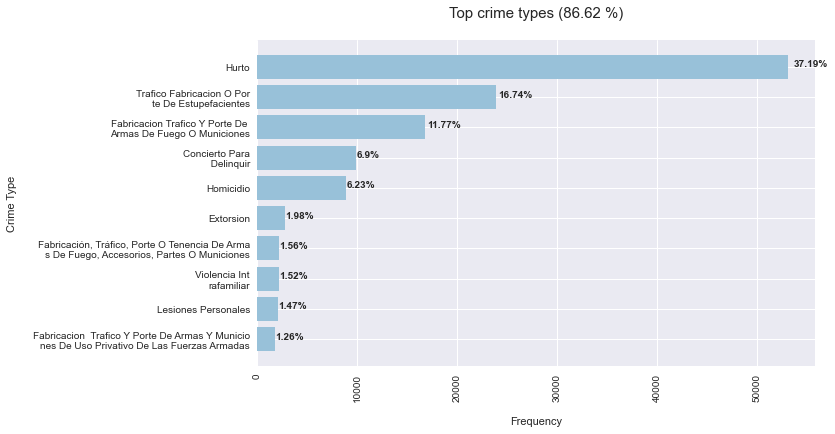

In [35]:
temp               = inmate.DELITO.str.title().value_counts().to_frame().reset_index().rename(columns = {'index':'DELITONAME'})
temp['DELITO_PER'] = round(temp.DELITO*100/temp.DELITO.sum(),2)
temp               = temp.head(10).sort_values(by = 'DELITO', ascending = True)
temp.DELITONAME    = temp.DELITONAME.apply(lambda x: x[:int(len(x)/2 + 2)] + '\n' + x[int(len(x)/2 + 2):] if len(x) > 20 else x)

plt.figure(figsize = (10,6))
plt.barh(temp.DELITONAME, temp.DELITO, color = '#98c1d9')
plt.xticks(rotation = 90)
plt.title('Top crime types (%.2f %%)\n' % (temp.DELITO.sum()*100/inmate.shape[0]), fontsize = 15)

for i in range(len(temp)):
    plt.text(1.01*temp.DELITO[i], temp.DELITONAME[i], str(temp.DELITO_PER[i]) + '%', fontweight = 'bold')

plt.ylabel('Crime Type\n')
plt.xlabel('\nFrequency')
plt.show()

### Crime category 

In [36]:
# Count number of observations by crime category
temp = inmate[['TENTATIVA','AGRAVADO','CALIFICADO']].reset_index().rename(columns = {'index':'id'})
temp = pd.melt(temp, id_vars = ['id'], value_vars = ['TENTATIVA','AGRAVADO','CALIFICADO']).groupby('variable').value.sum().to_frame().reset_index()
temp['percent'] = round(temp.value/temp.value.sum(),3)

In [37]:
# Table: observations by crime category
temp

,variable,value,percent
0,AGRAVADO,47200,0.480
1,CALIFICADO,40769,0.415
2,TENTATIVA,10295,0.105


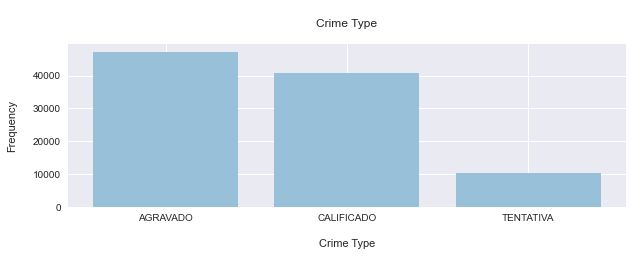

In [38]:
plt.figure(figsize = (10,3))
plt.bar(temp.variable, temp.value, color = '#98c1d9')
plt.title('\nCrime Type\n')
plt.xlabel('\nCrime Type')
plt.ylabel('Frequency\n')
plt.show()

### Crime type vs Crime category

In [39]:
# Count number of observations by crime type and category
top10 = list(inmate.DELITO.value_counts().to_frame().reset_index().rename(columns = {'index':'DELITONAME'}).head(10)['DELITONAME'])
top10.remove('HURTO')
temp  = inmate[['DELITO','TENTATIVA','AGRAVADO','CALIFICADO']].groupby('DELITO').sum().reset_index()
temph  = temp[temp.DELITO =='HURTO']
temph  = pd.melt(temph, id_vars = ['DELITO'], value_vars = ['TENTATIVA','AGRAVADO','CALIFICADO'])

temph.DELITO = temph.DELITO.apply(lambda x: x[:int(len(x)/2 + 2)] + '\n' + x[int(len(x)/2 + 2):] if len(x) > 20 else x)

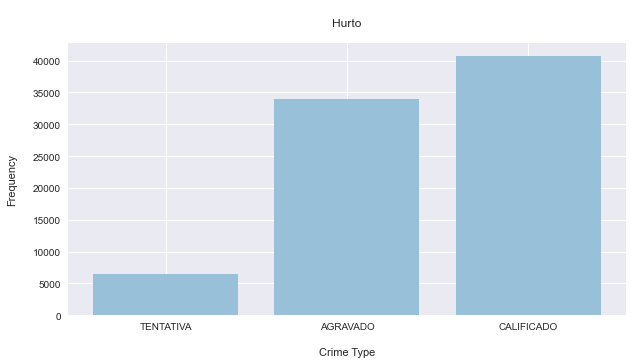

In [40]:
plt.figure(figsize = (10,5))
plt.bar(temph.variable, temph.value, color = '#98c1d9')
plt.title('\nHurto\n')
plt.xlabel('\nCrime Type')
plt.ylabel('Frequency\n')
plt.show()

In [41]:
# Top 10 crimes except Hurto
temp  = temp[temp.DELITO.isin(top10)]
temp  = pd.melt(temp, id_vars = ['DELITO'], value_vars = ['TENTATIVA','AGRAVADO','CALIFICADO'])

temp.DELITO = temp.DELITO.apply(lambda x: x[:int(len(x)/2 + 2)] + '\n' + x[int(len(x)/2 + 2):] if len(x) > 20 else x)

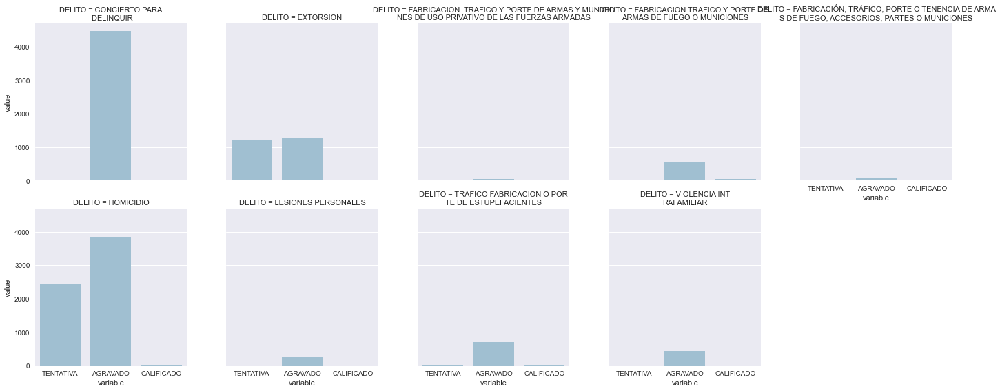

In [43]:
plot = sns.FacetGrid(temp, col = "DELITO", col_wrap = 5, height = 4)
plot.map(sns.barplot, 'variable', 'value', color = '#98c1d9')
plt.show()

### Age

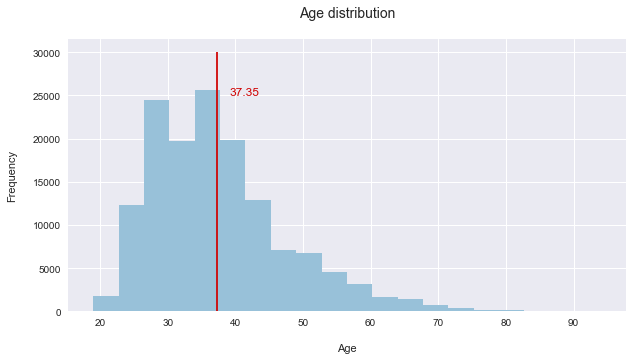

In [44]:
plt.figure(figsize = (10,5))
plt.hist(inmate.EDAD, bins = 20, label = 'Capture Date', color = '#98c1d9')
plt.vlines(inmate.EDAD.mean(), 0, 30000, color = '#d00000')
plt.title('Age distribution\n', fontsize = 14)
plt.text(inmate.EDAD.mean()*1.05, 25000, str(round(inmate.EDAD.mean(),2)), color = '#d00000', fontsize = 12)
plt.ylabel('Frequency\n')
plt.xlabel('\nAge')
plt.show()

### Gender

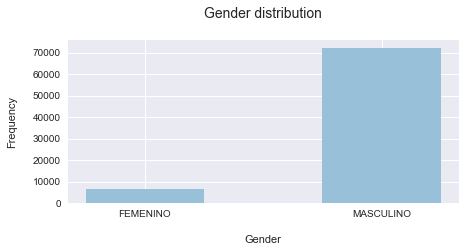

In [45]:
# Count number of inmates per gender
temp = inmate.groupby(['INTERNOEN','GENERO']).count().DELITO.reset_index() \
       .groupby('GENERO').count().DELITO.reset_index().rename(columns = {'DELITO':'ncount'})

# Plot 
plt.figure(figsize = (7,3))
plt.bar(temp.GENERO, temp.ncount, width = 0.5, color = '#98c1d9')
plt.title('Gender distribution\n', fontsize = 14)
plt.ylabel('Frequency\n')
plt.xlabel('\nGender')
plt.show()

### Marital status

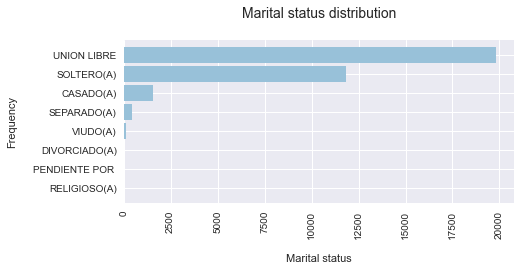

In [46]:
# Count number of inmates by marital status
temp = inmate.groupby(['INTERNOEN','ESTADO_CIVIL']).count().DELITO.reset_index() \
       .groupby('ESTADO_CIVIL').count().DELITO.reset_index().rename(columns = {'DELITO':'ncount'}) \
       .sort_values(['ncount'])

# Plot 
plt.figure(figsize = (7,3))
plt.barh(temp.ESTADO_CIVIL, temp.ncount, color = '#98c1d9')
plt.title('Marital status distribution\n', fontsize = 14)
plt.ylabel('Frequency\n')
plt.xlabel('\nMarital status')
plt.xticks(rotation = 90)
plt.show()

### Main cities

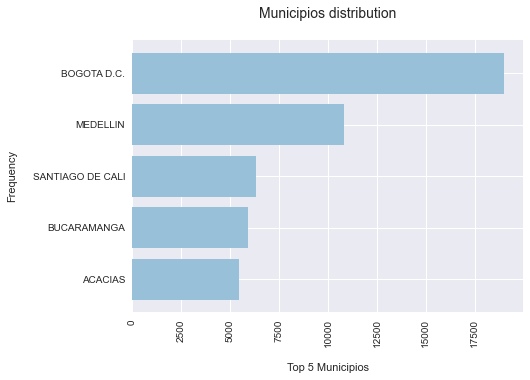

In [47]:
# Count number of inmates by municipio
temp = inmate.MPIO_ESTABLECIMIENTO.value_counts().reset_index().head(5) \
       .rename(columns = {'index':'MPIO','MPIO_ESTABLECIMIENTO':'ncount'}).sort_values(['ncount'])

# Plot 
plt.figure(figsize = (7,5))
plt.barh(temp.MPIO, temp.ncount, color = '#98c1d9')
plt.title('Municipios distribution\n', fontsize = 14)
plt.ylabel('Frequency\n')
plt.xlabel('\nTop 5 Municipios')
plt.xticks(rotation = 90)
plt.show()

### Activities

In [48]:
# Count number of observations by activities
temp = inmate[['ACTIVIDADES_TRABAJO','ACTIVIDADES_ESTUDIO', 'ACTIVIDADES_ENSEÑANZA']].reset_index().rename(columns = {'index':'id'})
temp = pd.melt(temp, id_vars = ['id'], value_vars = ['ACTIVIDADES_TRABAJO','ACTIVIDADES_ESTUDIO', 'ACTIVIDADES_ENSEÑANZA']).groupby('variable').value.sum().to_frame().reset_index()

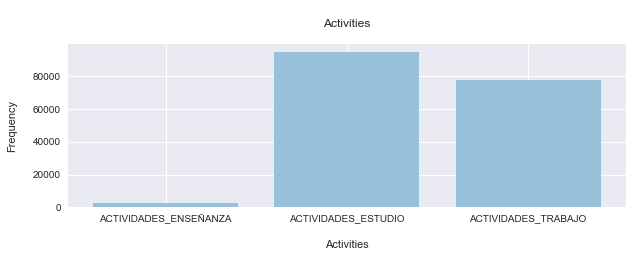

In [50]:
plt.figure(figsize = (10,3))
plt.bar(temp.variable, temp.value, color = '#98c1d9')
plt.title('\nActivities\n')
plt.xlabel('\nActivities')
plt.ylabel('Frequency\n')
plt.show()

### Time in jail

In [51]:
# Calculate time in jail in days and year
inmate['timejail_day']  = (inmate.FECHA_SALIDA - inmate.FECHA_INGRESO)
inmate.timejail_day     = inmate.timejail_day.dt.days
inmate['timejail_year'] = inmate.timejail_day/365

In [52]:
# Drop duplicates
temp = inmate[['INTERNOEN','FECHA_INGRESO','timejail_day','timejail_year']].drop_duplicates()

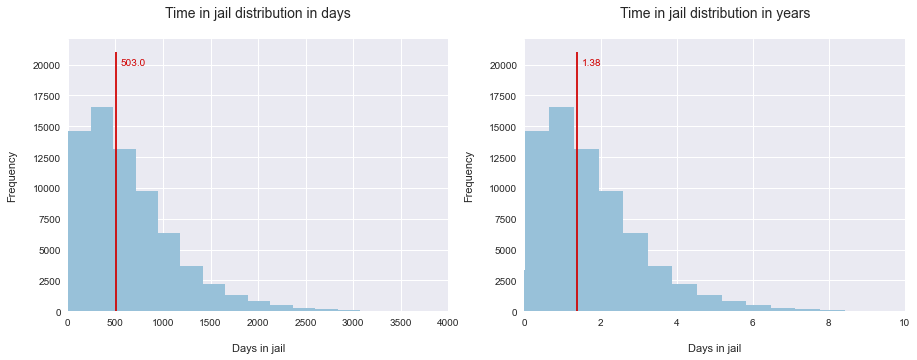

In [54]:
# Plot in days and year
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)

plt.hist(temp.timejail_day, bins = 30, color = '#98c1d9')
plt.vlines(temp.timejail_day.median(), 0, 21000, color = '#d00000')
plt.title('Time in jail distribution in days\n', fontsize = 14)
plt.text(temp.timejail_day.median()*1.1, 20000, str(round(temp.timejail_day.median(),2)), color = '#d00000')
plt.ylabel('Frequency\n')
plt.xlabel('\nDays in jail')
plt.xlim(0,4000)

plt.subplot(1,2,2)

plt.hist(temp.timejail_year, bins = 30, color = '#98c1d9')
plt.vlines(temp.timejail_year.median(), 0, 21000, color = '#d00000')
plt.title('Time in jail distribution in years\n', fontsize = 14)
plt.text(temp.timejail_year.median()*1.1, 20000, str(round(temp.timejail_year.median(),2)), color = '#d00000')
plt.ylabel('Frequency\n')
plt.xlabel('\nDays in jail')
plt.xlim(0,10)

plt.show()

In [55]:
temp = temp.timejail_year.dropna().round().value_counts().to_frame().reset_index().rename(columns = {'index':'years','timejail_year':'ncount'})
temp = temp[temp.years > 0]
temp['timejail_percent'] = 100*temp.ncount/temp.ncount.sum()
temp.round().T

,0,1,3,4,5,6,8,9,10,11
years,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
ncount,25126.0,17235.0,9270.0,4076.0,1876.0,835.0,331.0,134.0,46.0,11.0
timejail_percent,43.0,29.0,16.0,7.0,3.0,1.0,1.0,0.0,0.0,0.0


#### Distribution of time in jail across top 10 crime types 

In [56]:
# Define top 10 crimes
top10 = top10 + ['HURTO']

In [57]:
# Reshape dataset
temp = inmate[['INTERNOEN','DELITO','FECHA_INGRESO','timejail_day','timejail_year']]
temp = temp[temp.DELITO.isin(top10)]
temp = temp.pivot_table(index = ['INTERNOEN','FECHA_INGRESO'], columns = 'DELITO', values = 'timejail_day').reset_index()

In [154]:
for i, var in enumerate(top10):
    print('Delito {}: {}'.format(i+1, var.title()))

Delito 1: Trafico Fabricacion O Porte De Estupefacientes
Delito 2: Fabricacion Trafico Y Porte De Armas De Fuego O Municiones
Delito 3: Concierto Para Delinquir
Delito 4: Homicidio
Delito 5: Extorsion
Delito 6: Fabricación, Tráfico, Porte O Tenencia De Armas De Fuego, Accesorios, Partes O Municiones
Delito 7: Violencia Intrafamiliar
Delito 8: Lesiones Personales
Delito 9: Fabricacion  Trafico Y Porte De Armas Y Municiones De Uso Privativo De Las Fuerzas Armadas
Delito 10: Hurto


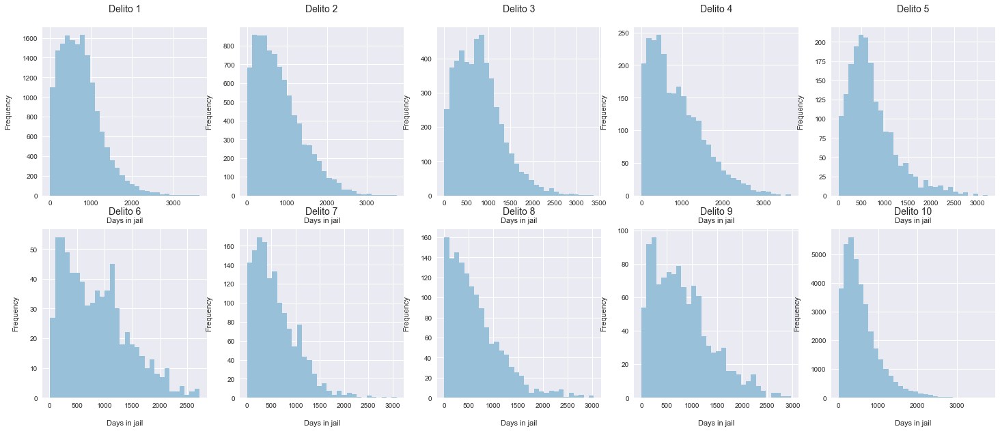

In [59]:
plt.figure(figsize = (25,10))

for i, var in enumerate(top10):
    
    # Omit negative values
    temp2 = temp[temp[var] > 0][var]
    
    # Subplot
    plt.subplot(2,5,i+1)

    plt.hist(temp2, bins = 30, color = '#98c1d9')
    plt.title('Delito {}\n'.format(str(i+1)), fontsize = 14)
    plt.ylabel('Frequency\n')
    plt.xlabel('\nDays in jail')

plt.show()

#### Distribution of time in jail across crime categories 

In [69]:
# Remove duplicates
temp = inmate[['INTERNOEN','FECHA_INGRESO','timejail_day','timejail_year','TENTATIVA','AGRAVADO','CALIFICADO']] \
       .groupby(['INTERNOEN','FECHA_INGRESO']).mean().reset_index()

# Crime categories engineering
# Given that we calculate the mean, for cases with values greater than 0, replace with 1
temp.TENTATIVA  = temp.TENTATIVA .apply(lambda x: 1 if x > 0 else 0)
temp.AGRAVADO   = temp.AGRAVADO  .apply(lambda x: 1 if x > 0 else 0)
temp.CALIFICADO = temp.CALIFICADO.apply(lambda x: 1 if x > 0 else 0)

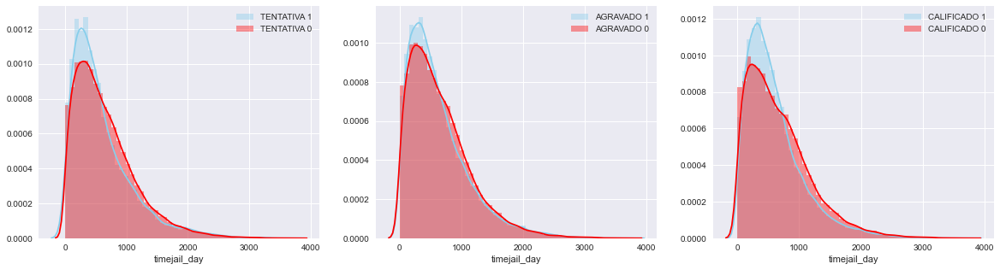

In [70]:
plt.figure(figsize = (20,5))

for i, var in enumerate(['TENTATIVA','AGRAVADO','CALIFICADO']):
    
    temp2 = temp[temp.timejail_day > 0]

    plt.subplot(1,3,i+1)
    sns.distplot(temp2[temp2[var] == 1].timejail_day.dropna() , color = "skyblue", label = var + " 1")
    sns.distplot(temp2[temp2[var] == 0].timejail_day.dropna() , color = "red"    , label = var + " 0")
    plt.legend()

plt.show()

#### Distribution of time in jail across crime activities 

In [155]:
# Remove duplicates
temp = inmate[['INTERNOEN','FECHA_INGRESO','timejail_day','timejail_year','ACTIVIDADES_TRABAJO','ACTIVIDADES_ESTUDIO','ACTIVIDADES_ENSEÑANZA']] \
       .groupby(['INTERNOEN','FECHA_INGRESO']).mean().reset_index()

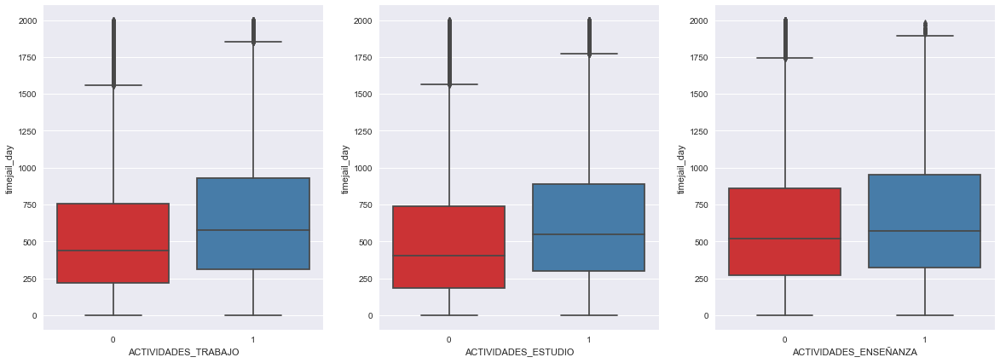

In [164]:
plt.figure(figsize = (20,7))

for i, var in enumerate(['ACTIVIDADES_TRABAJO','ACTIVIDADES_ESTUDIO','ACTIVIDADES_ENSEÑANZA']):
    
    temp2 = temp[temp.timejail_day > 0]
    temp2 = temp2[temp2.timejail_day < 2000]

    plt.subplot(1,3,i+1)
    sns.boxplot(temp2[var], temp2.timejail_day.dropna(), palette = "Set1")

plt.show()

### Time between release date *t-1* and booking date *t*

In [137]:
# Omit duplicates
temp = inmate[['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA']]\
       .sort_values(by = ['INTERNOEN','FECHA_INGRESO'])\
       .groupby(['INTERNOEN','FECHA_INGRESO'])\
       .max().reset_index()

# Exclude inmates still in jail
temp = temp[temp.FECHA_SALIDA.notnull()]

# Lag of release date 
temp['FECHA_SALIDA_t_1'] = temp.groupby('INTERNOEN').FECHA_SALIDA.shift(1)

# Calculate time between release date t-1 and booking date t
temp['recidivism_day']  = (temp.FECHA_CAPTURA - temp.FECHA_SALIDA_t_1)
temp.recidivism_day     = temp.recidivism_day.dt.days
temp['recidivism_year'] = temp.recidivism_day/365

# Exclude negative recidivisma
temp = temp[temp.recidivism_day > 0]

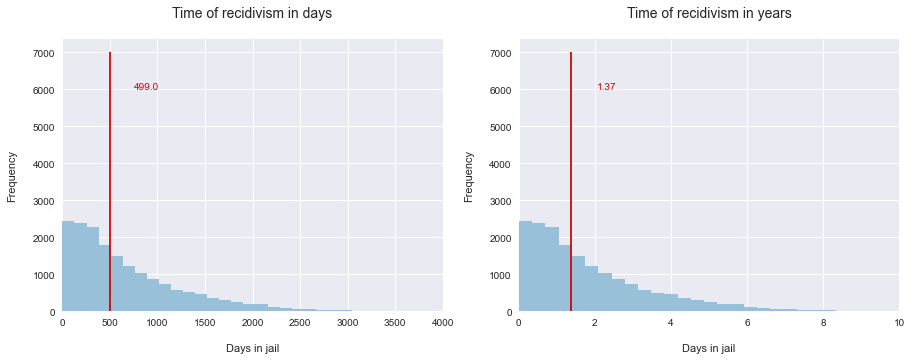

In [138]:
# Plot in days and year
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)

plt.hist(temp.recidivism_day, bins = 30, color = '#98c1d9')
plt.vlines(temp.recidivism_day.median(), 0, 7000, color = '#d00000')
plt.title('Time of recidivism in days\n', fontsize = 14)
plt.text(temp.recidivism_day.median()*1.5, 6000, str(round(temp.recidivism_day.median(),2)), color = '#d00000')
plt.ylabel('Frequency\n')
plt.xlabel('\nDays in jail')
plt.xlim(0,4000)

plt.subplot(1,2,2)

plt.hist(temp.recidivism_year, bins = 30, color = '#98c1d9')
plt.vlines(temp.recidivism_year.median(), 0, 7000, color = '#d00000')
plt.title('Time of recidivism in years\n', fontsize = 14)
plt.text(temp.recidivism_year.median()*1.5, 6000, str(round(temp.recidivism_year.median(),2)), color = '#d00000')
plt.ylabel('Frequency\n')
plt.xlabel('\nDays in jail')
plt.xlim(0,10)

plt.show()

In [94]:
# Calculate average recidivism rate per year
temp['year_salida_t_1'] = temp[temp.recidivism_day > 0].FECHA_SALIDA_t_1.dt.year
temp2 = temp.groupby('year_salida_t_1').mean().reset_index()

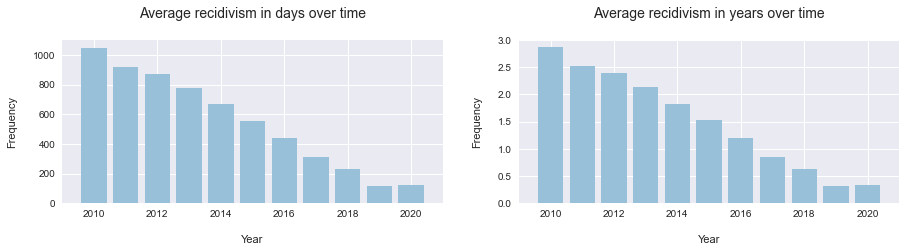

In [95]:
# Plot in days and year
plt.figure(figsize = (15,3))

plt.subplot(1,2,1)

plt.bar(temp2.year_salida_t_1, temp2.recidivism_day, color = '#98c1d9')
plt.title('Average recidivism in days over time\n', fontsize = 14)
plt.ylabel('Frequency\n')
plt.xlabel('\nYear')
plt.xlim(2009,2021)
plt.ylim(0,1100)

plt.subplot(1,2,2)

plt.bar(temp2.year_salida_t_1, temp2.recidivism_year, color = '#98c1d9')
plt.title('Average recidivism in years over time\n', fontsize = 14)
plt.ylabel('Frequency\n')
plt.xlabel('\nYear')
plt.xlim(2009,2021)
plt.ylim(0, 3)

plt.show()

#### Distribution of time out of jail across top 10 crime types 

In [85]:
# Reshape temp table: categorization of crime types
temp2 = inmate[['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA','DELITO']]
temp2 = temp2.assign(val = 1)
temp2 = temp2[temp2.DELITO.isin(top10)]
temp2 = pd.pivot_table(temp2, values = 'val', index = ['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA'], columns = ['DELITO']).reset_index()

In [86]:
# Join: recidivism and crime type
temp3 = pd.merge(temp,temp2, how = 'left', on = ['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA'])

In [87]:
for i, var in enumerate(top10):
    print('Delito {}: {}'.format(i, var.title()[:80]))

Delito 0: Trafico Fabricacion O Porte De Estupefacientes
Delito 1: Fabricacion Trafico Y Porte De Armas De Fuego O Municiones
Delito 2: Concierto Para Delinquir
Delito 3: Homicidio
Delito 4: Extorsion
Delito 5: Fabricación, Tráfico, Porte O Tenencia De Armas De Fuego, Accesorios, Partes O M
Delito 6: Violencia Intrafamiliar
Delito 7: Lesiones Personales
Delito 8: Fabricacion  Trafico Y Porte De Armas Y Municiones De Uso Privativo De Las Fuerz
Delito 9: Hurto


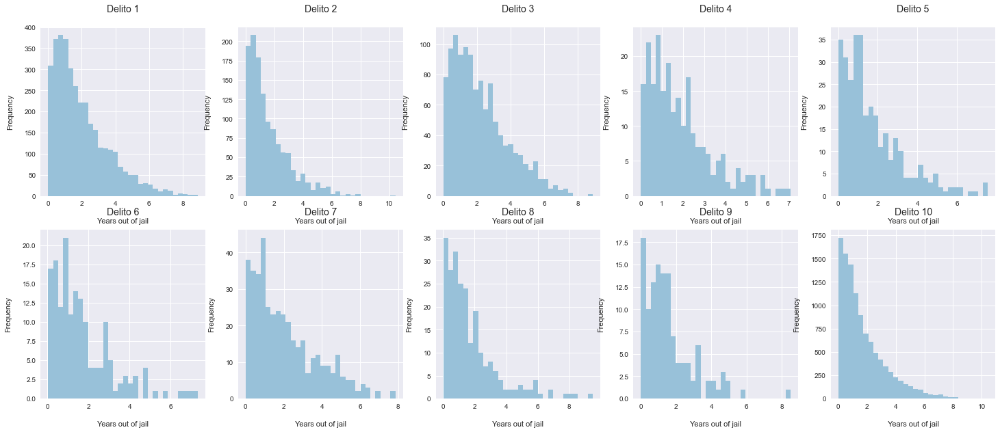

In [88]:
plt.figure(figsize = (25,10))

for i, var in enumerate(top10):
    
    # Recidivism day 
    tempvar = temp3[temp3.recidivism_year > 0][var]*temp3[temp3.recidivism_year > 0].recidivism_year
    
    # Subplot
    plt.subplot(2,5,i+1)

    plt.hist(tempvar, bins = 30, color = '#98c1d9')
    plt.title('Delito {}\n'.format(str(i+1)), fontsize = 14)
    plt.ylabel('Frequency\n')
    plt.xlabel('\nYears out of jail')

plt.show()

#### Distribution of time out of jail across crime categories

In [100]:
# Remove duplicates
temp2 = inmate[['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA','TENTATIVA','AGRAVADO','CALIFICADO']] \
        .groupby(['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA']).mean().reset_index()

# Crime categories engineering
# Given that we calculate the mean, for cases with values greater than 0, replace with 1
temp2.TENTATIVA  = temp2.TENTATIVA .apply(lambda x: 1 if x > 0 else 0)
temp2.AGRAVADO   = temp2.AGRAVADO  .apply(lambda x: 1 if x > 0 else 0)
temp2.CALIFICADO = temp2.CALIFICADO.apply(lambda x: 1 if x > 0 else 0)

In [101]:
# Join: recidivism and crime category
temp3 = pd.merge(temp,temp2, how = 'left', on = ['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA'])

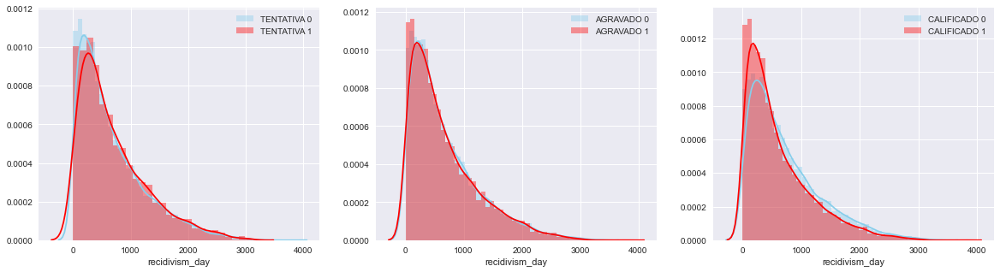

In [109]:
plt.figure(figsize = (20,5))

for i, var in enumerate(['TENTATIVA','AGRAVADO','CALIFICADO']):
    
    tempvar = temp3[temp3.recidivism_day > 0]

    plt.subplot(1,3,i+1)
    sns.distplot(tempvar[tempvar[var] == 0].recidivism_day.dropna() , color = "skyblue", label = var + " 0")
    sns.distplot(tempvar[tempvar[var] == 1].recidivism_day.dropna() , color = "red"    , label = var + " 1")
    plt.legend()

plt.show()

#### Distribution of time out of jail across activities

In [114]:
# Remove duplicates
temp2 = inmate[['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA','ACTIVIDADES_TRABAJO','ACTIVIDADES_ESTUDIO','ACTIVIDADES_ENSEÑANZA']] \
        .groupby(['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA']).mean().reset_index()

In [115]:
# Join: recidivism and activity
temp3 = pd.merge(temp,temp2, how = 'left', on = ['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA'])

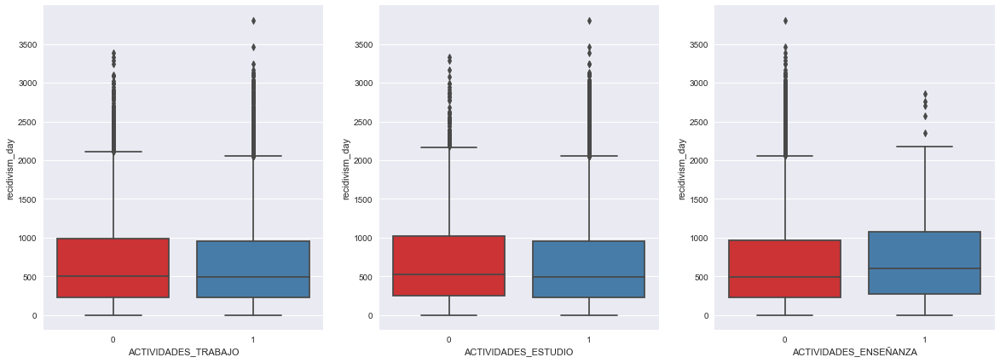

In [116]:
plt.figure(figsize = (20,7))

for i, var in enumerate(['ACTIVIDADES_TRABAJO','ACTIVIDADES_ESTUDIO','ACTIVIDADES_ENSEÑANZA']):
    
    tempvar = temp3[temp3.recidivism_day > 0]

    plt.subplot(1,3,i+1)
    sns.boxplot(tempvar[var], tempvar.recidivism_day.dropna(), palette = "Set1")

plt.show()

## Survival Analysis

In [150]:
temp.head(5)

,INTERNOEN,FECHA_INGRESO,FECHA_SALIDA,FECHA_CAPTURA,FECHA_SALIDA_t_1,recidivism_day,recidivism_year,event
12,00095AF508DBAFD6D18C3F2A93304F53D78E3F58,2018-11-05,2020-09-03,2019-03-04,2011-08-16,2757.0,7.553425,0
17,000ECF8B403C9DE68CF8B8E21DA4D9CBC2BDAE24,2020-02-02,2020-04-27,2019-09-07,2014-03-06,2011.0,5.509589,0
19,00127BA2D79F34EBBB140BAA128F55C96DB2CABC,2015-01-22,2016-09-19,2014-11-20,2012-02-04,1020.0,2.794521,0
24,0016A377C04A366203670BE6DBA907CDF585B736,2012-05-28,2014-03-17,2012-05-23,2011-09-16,250.0,0.684932,1
32,001BBF650DF5791C71643FBAA11235E739CE30F9,2011-10-22,2012-04-05,2011-06-20,2011-02-01,139.0,0.380822,1


In [153]:
inmate[['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA']]\
       .sort_values(by = ['INTERNOEN','FECHA_INGRESO'])\
       .groupby(['INTERNOEN','FECHA_INGRESO'])\
       .count().reset_index()

,INTERNOEN,FECHA_INGRESO,FECHA_SALIDA,FECHA_CAPTURA
0,000334541B6B3305CE91761942D7B381248777EA,2018-06-08,0,1
1,000357E4F19E3722BA43488F69A7D7DECFC620C4,2019-09-25,0,2
2,000393AD7FE65FBBE53A61B0EAA1FB9A62F71450,2013-05-17,2,2
3,0003BE212427DF2E9CCB2449B6012EF915B3FAE3,2014-10-24,1,1
4,00043EB254F6E5EFCE77A8C20BC709B63A4BE443,2018-08-23,0,1
5,0004E9FCF51B47B727F1D6A389B5CD0929344561,2017-07-18,1,1
6,0006F969D7EB7E2DD76A3F7F07D7116798FD51BF,2020-04-28,0,1
7,0007F727CB3E6D30F1BFAC3834CDAFAC6FF40025,2018-01-03,0,2
8,0008649DEF36F510807D0AB58A84CF74E6083FBF,2016-01-29,2,2
9,0008649DEF36F510807D0AB58A84CF74E6083FBF,2019-02-09,0,2


In [ ]:
# Omit duplicates
temp = inmate[['INTERNOEN','FECHA_INGRESO','FECHA_SALIDA','FECHA_CAPTURA']]\
       .sort_values(by = ['INTERNOEN','FECHA_INGRESO'])\
       .groupby(['INTERNOEN','FECHA_INGRESO'])\
       .max().reset_index()

# Exclude inmates still in jail
temp = temp[temp.FECHA_SALIDA.notnull()]

# Lag of release date 
temp['FECHA_SALIDA_t_1'] = temp.groupby('INTERNOEN').FECHA_SALIDA.shift(1)

# Calculate time between release date t-1 and booking date t
temp['recidivism_day']  = (temp.FECHA_CAPTURA - temp.FECHA_SALIDA_t_1)
temp.recidivism_day     = temp.recidivism_day.dt.days
temp['recidivism_year'] = temp.recidivism_day/365

# Exclude negative recidivisma
temp = temp[temp.recidivism_day > 0]

In [143]:
# Define event as come back to jail in less than one year
temp['event'] = (temp.recidivism_year < 1)*1

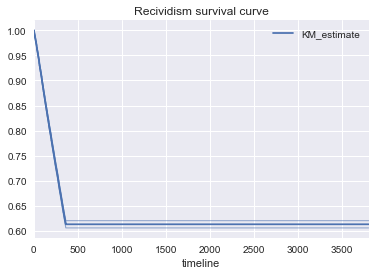

In [147]:
kmf = KaplanMeierFitter()
kmf.fit(temp.recidivism_day, temp.event)
kmf.plot(title='Recividism survival curve',ci_force_lines = True)

## Descriptive Statistics over time

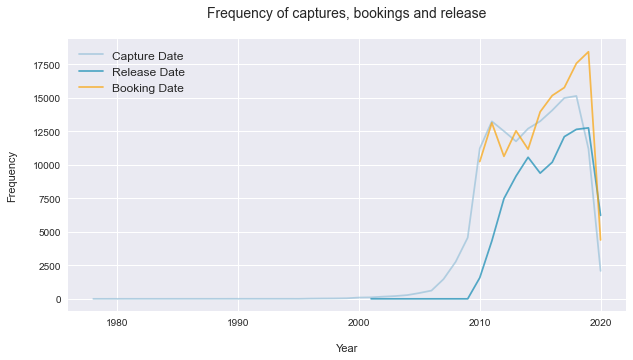

In [42]:
plt.figure(figsize = (10,5))
plt.plot(inmate.FECHA_CAPTURA.dt.year.value_counts().to_frame().sort_index()        , label = 'Capture Date', color = '#98c1d9', alpha = 0.7)
plt.plot(inmate.FECHA_SALIDA.dropna().dt.year.value_counts().to_frame().sort_index(), label = 'Release Date', color = '#118ab2', alpha = 0.7)
plt.plot(inmate.FECHA_INGRESO.dt.year.value_counts().to_frame().sort_index()        , label = 'Booking Date', color = '#faa307', alpha = 0.7)
plt.title('Frequency of captures, bookings and release\n', fontsize = 14)
plt.ylabel('Frequency\n')
plt.xlabel('\nYear')
#plt.xlim(2000,2020)
plt.legend(loc = 'upper left', fontsize = 12)
plt.show()

## Missing Values

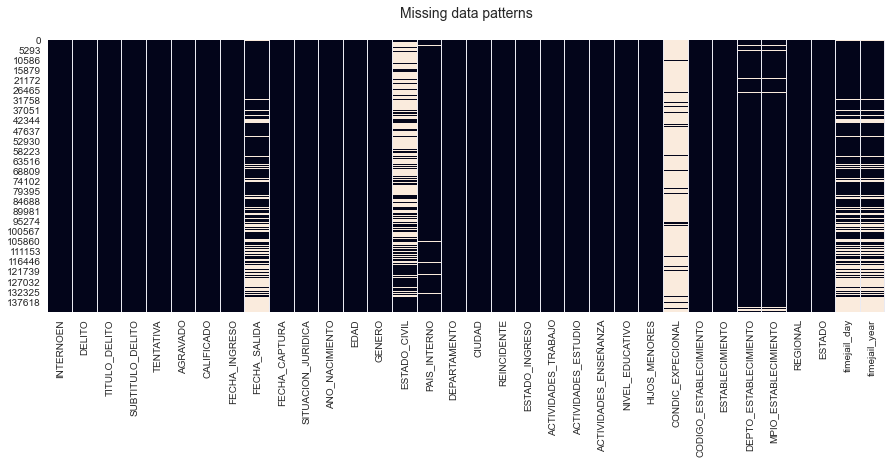

In [43]:
plt.figure(figsize = (15,5))
sns.heatmap(inmate.isnull(), cbar = False)
plt.title('Missing data patterns\n', fontsize = 14)
plt.show()